In [1]:
import numpy as np
import pandas as pd
import joblib
import matplotlib.pyplot as plt
import seaborn as sb
import warnings

from scipy.stats import kurtosis, skew
warnings.filterwarnings('ignore')

In [2]:
features = joblib.load("/mnt/shared_drive/data/brain_therapy/BT_MVP_Content_Pilot/MVP_Focused_Attention/pkls/feature_pkls/new_features.pkl")
features.head()

ecg_heart_rate  ecg_hrv_std  \
Participant Type context Datetime                                               
0001        2D   LL      2019-07-10 15:27:32.344       66.617321    75.818192   
                         2019-07-10 15:27:37.748       68.807339          NaN   
                         2019-07-10 15:27:42.980       61.525841          NaN   
                         2019-07-10 15:27:47.856       65.047702          NaN   
                         2019-07-10 15:27:52.468       61.174551    86.211057   

                                                  skin_temperature  eda_mean  \
Participant Type context Datetime                                              
0001        2D   LL      2019-07-10 15:27:32.344         12.958056   4.31652   
                         2019-07-10 15:27:37.748               NaN       NaN   
                         2019-07-10 15:27:42.980         12.968002       NaN   
                         2019-07-10 15:27:47.856               NaN       NaN   
                         2019-07-10 15:27:52.468         12.967983       NaN   

                                                  eda_no_of_peaks    eda_lf  \
Participant Type context Datetime                                             
0001        2D   LL      2019-07-10 15:27:32.344              4.0  0.003565   
                         2019-07-10 15:27:37.748              NaN       NaN   
                         2019-07-10 15:27:42.980              NaN       NaN   
                         2019-07-10 15:27:47.856              NaN       NaN   
                         2019-07-10 15:27:52.468              NaN       NaN   

                                                    eda_hf  eda_lf_hf_ratio  \
Participant Type context Datetime                                             
0001        2D   LL      2019-07-10 15:27:32.344  0.002215         1.609201   
                         2019-07-10 15:27:37.748       NaN              NaN   
                         2019-07-10 15:27:42.980       NaN              NaN   
                         2019-07-10 15:27:47.856       NaN              NaN   
                         2019-07-10 15:27:52.468       NaN              NaN   

                                                  feature_time  event_order  \
Participant Type context Datetime                                             
0001        2D   LL      2019-07-10 15:27:32.344             0            1   
                         2019-07-10 15:27:37.748             1            1   
                         2019-07-10 15:27:42.980             2            1   
                         2019-07-10 15:27:47.856             3            1   
                         2019-07-10 15:27:52.468             4            1   

                                                  event_session_order  \
Participant Type context Datetime                                       
0001        2D   LL      2019-07-10 15:27:32.344                    1   
                         2019-07-10 15:27:37.748                    1   
                         2019-07-10 15:27:42.980                    1   
                         2019-07-10 15:27:47.856                    1   
                         2019-07-10 15:27:52.468                    1   

                                                  session_order  
Participant Type context Datetime                                
0001        2D   LL      2019-07-10 15:27:32.344              1  
                         2019-07-10 15:27:37.748              1  
                         2019-07-10 15:27:42.980              1  
                         2019-07-10 15:27:47.856              1  
                         2019-07-10 15:27:52.468              1

In [3]:
features_with_order = features.drop(["feature_time","event_session_order","session_order"], axis = 1)
features.drop(["feature_time","event_order","event_session_order","session_order"], axis = 1,inplace = True)

In [4]:
feature_names = features.columns.values[0:11]
feature_names

array(['ecg_heart_rate', 'ecg_hrv_std', 'skin_temperature', 'eda_mean',
       'eda_no_of_peaks', 'eda_lf', 'eda_hf', 'eda_lf_hf_ratio'],
      dtype=object)

In [5]:
participants = features.index.get_level_values("Participant").unique()
p_type = features.index.get_level_values("Type")

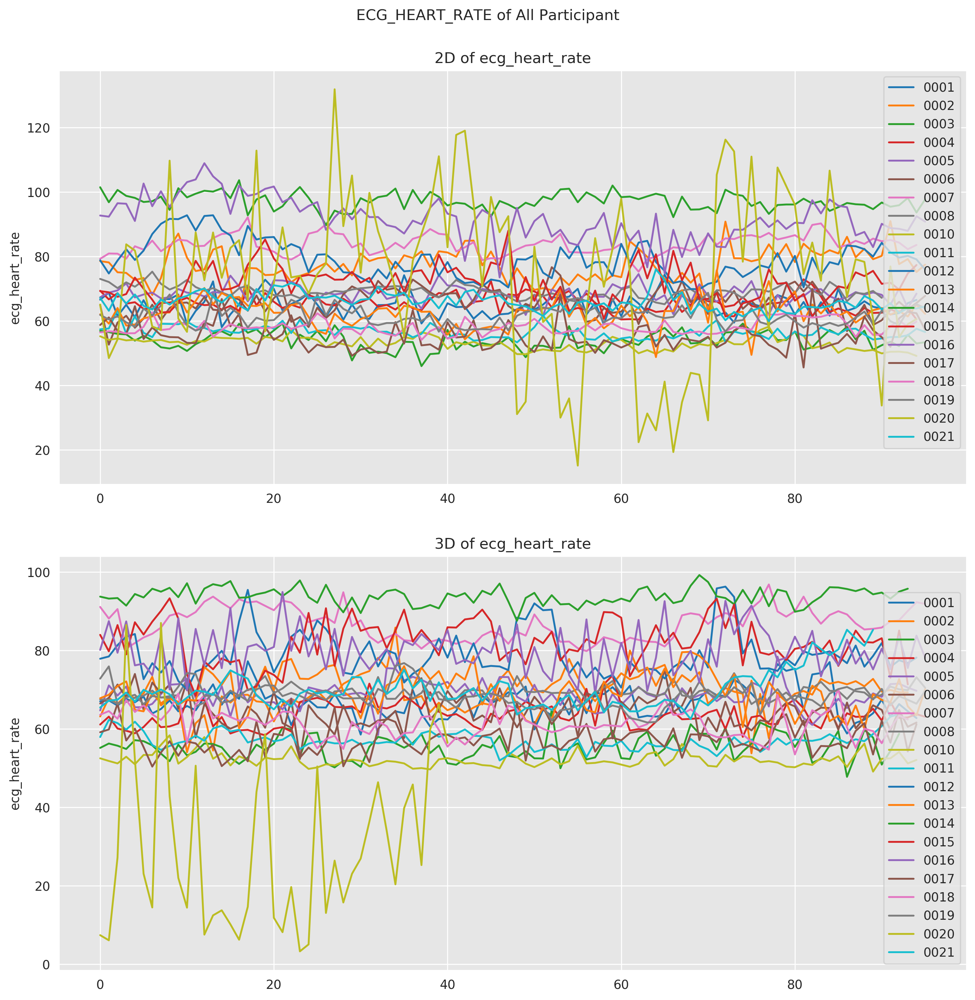

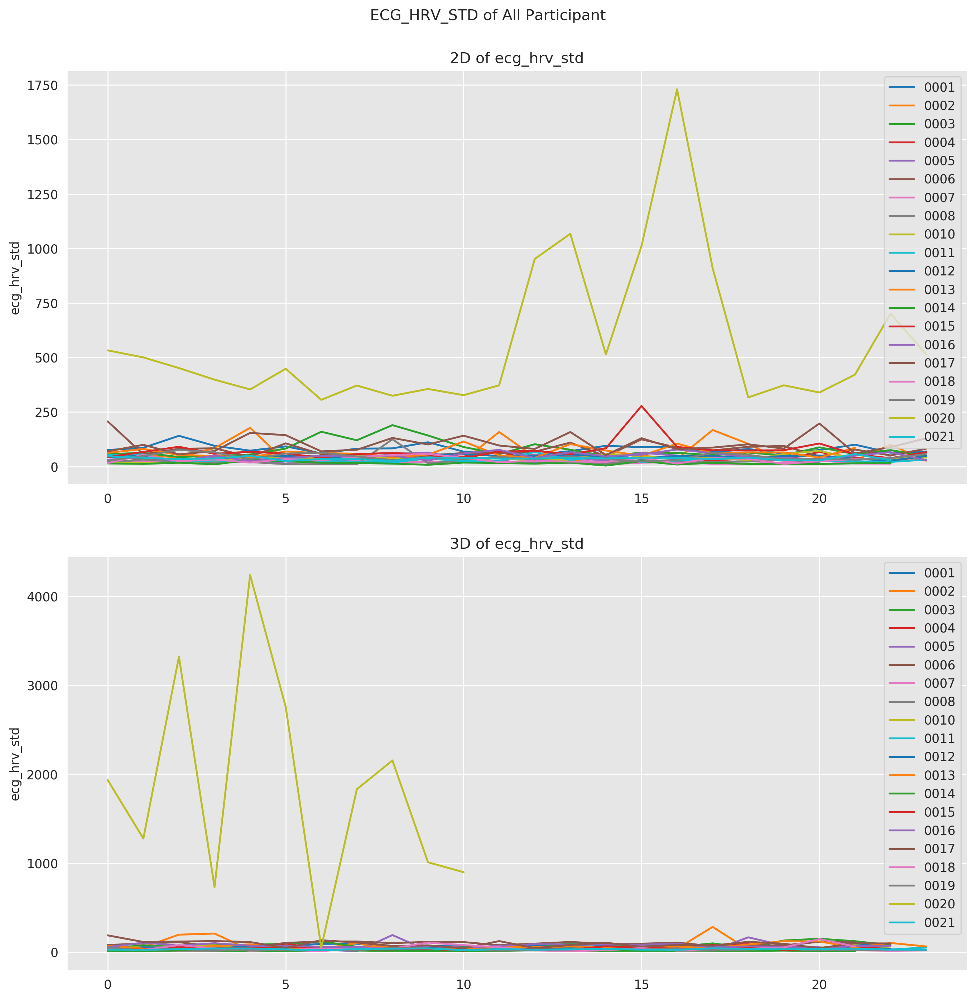

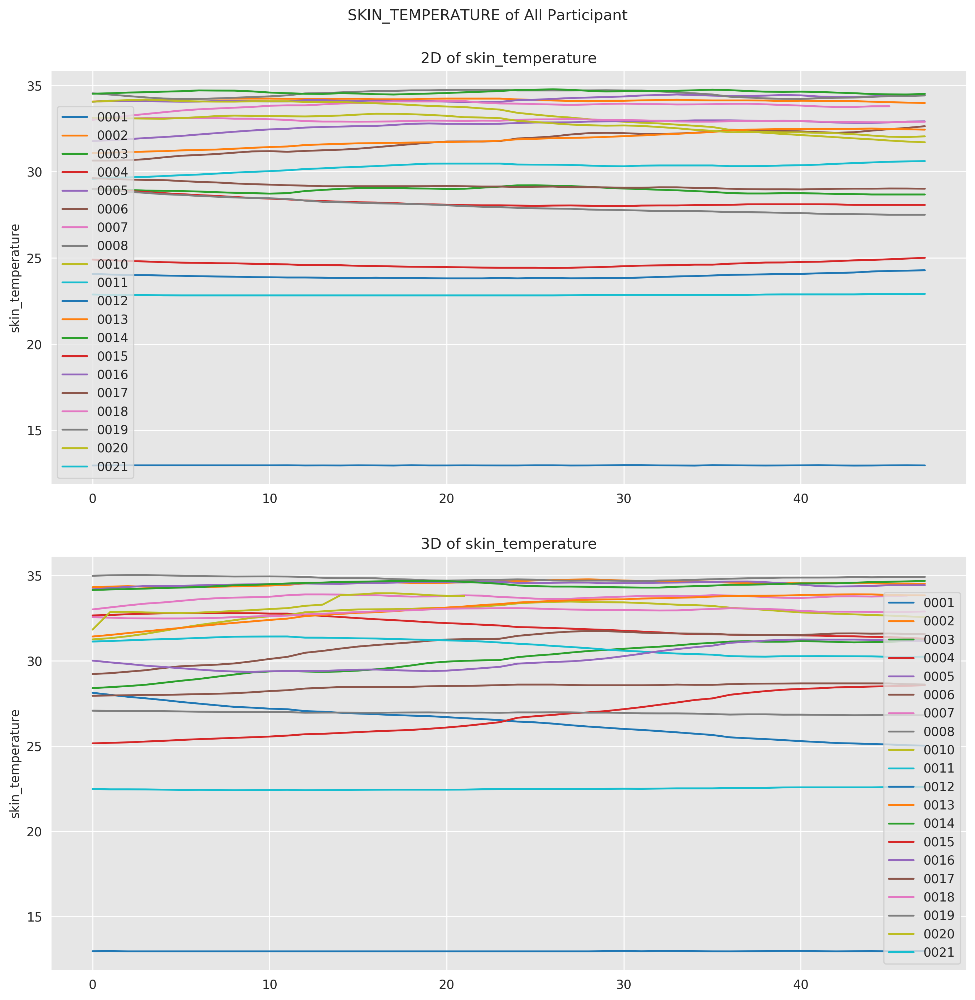

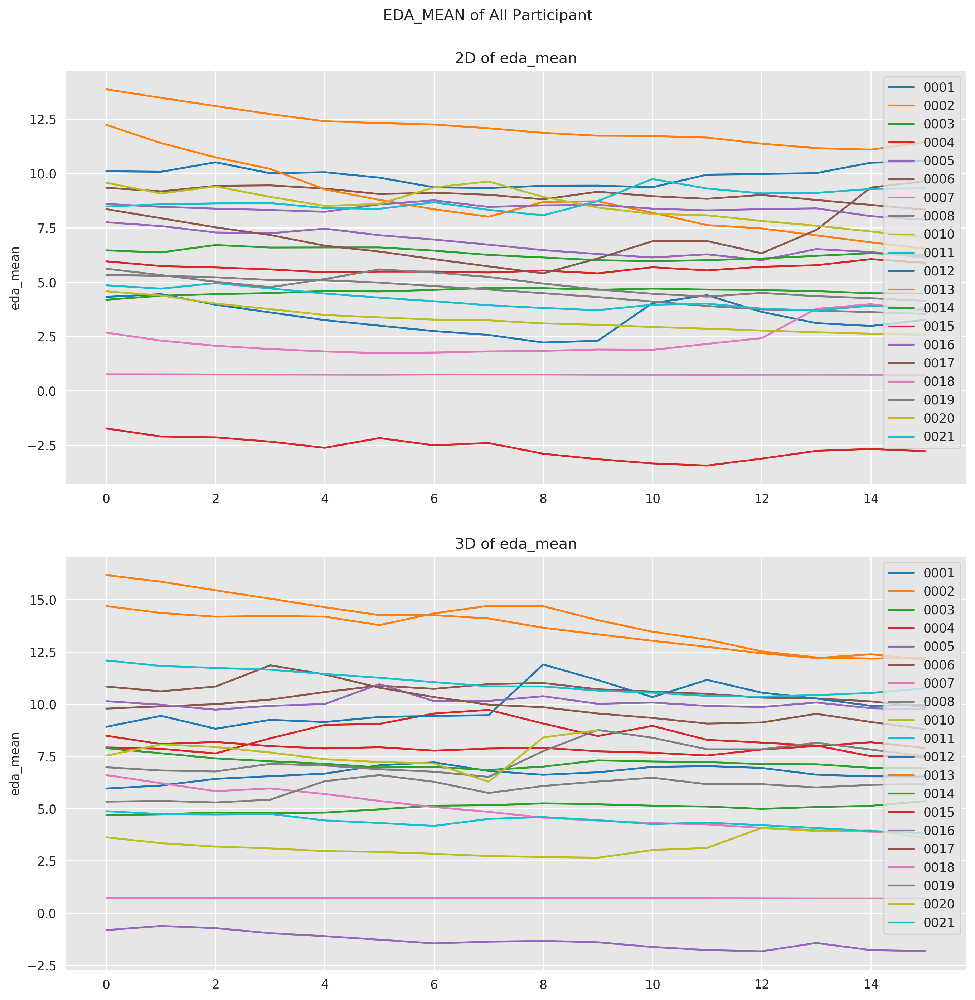

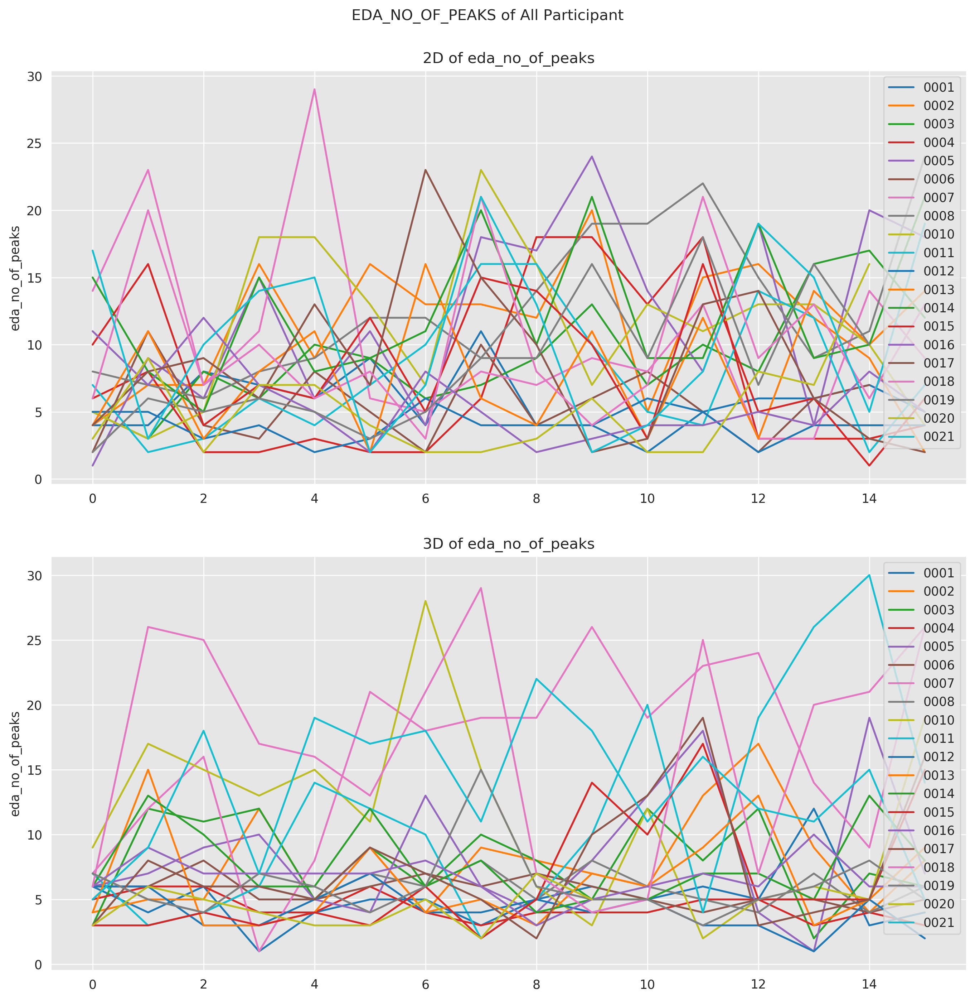

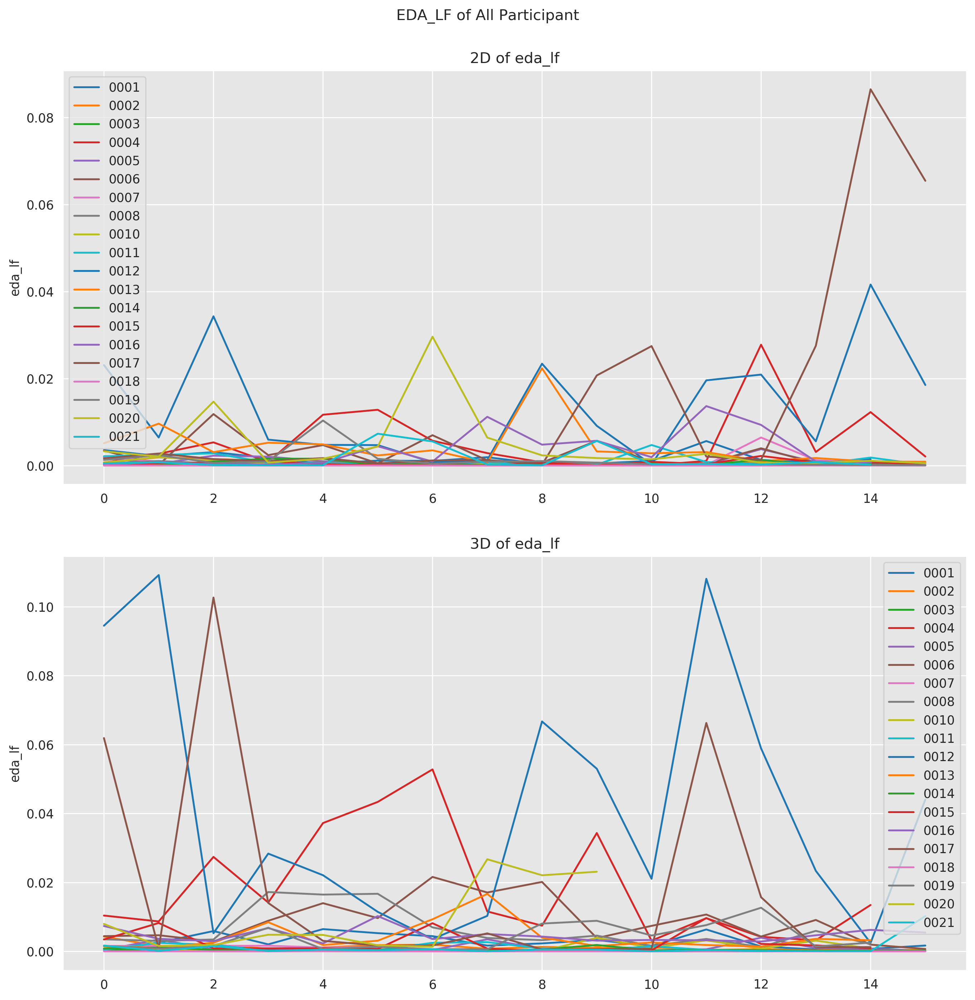

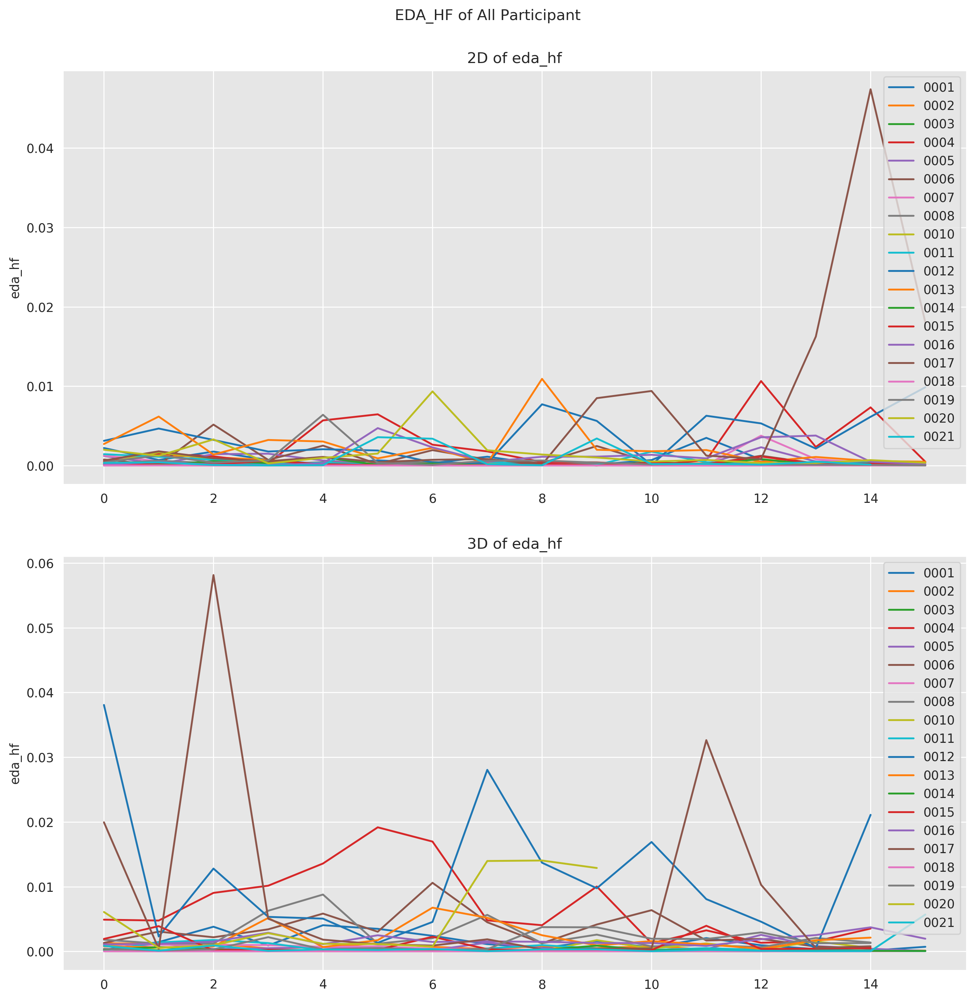

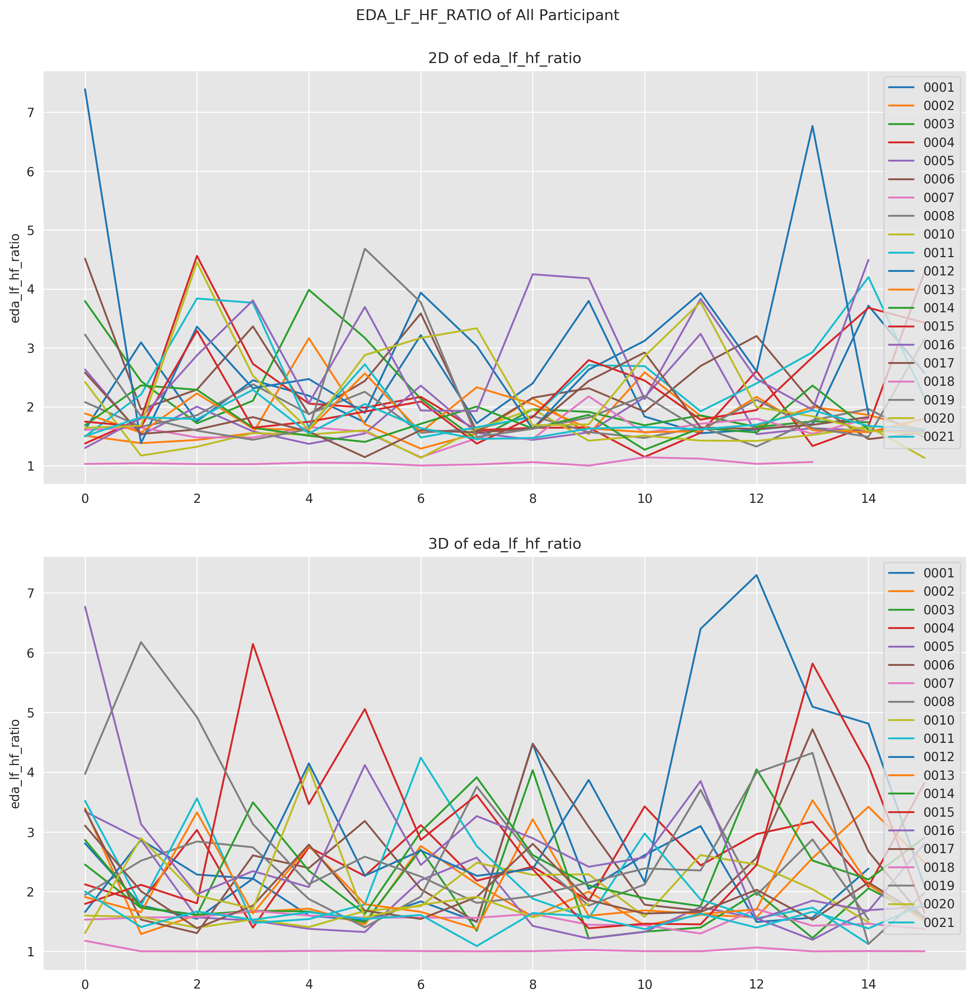

In [6]:
sb.set_style("darkgrid",{"axes.facecolor":".9"})
for feature_name in feature_names:
# for feature_name in ["skin_temperature"]: #Sample plot only
    fig, axes = plt.subplots(2,1, figsize = (11,11), dpi = 250)
    ax = axes.flatten()
    for participant in participants:
        data = features.loc(axis = 0)[participant,:,:,:]
        data = data[[feature_name]]
        data.dropna(inplace = True)
        two_d = data.loc(axis = 0)[:,'2D',:,:]
        three_d = data.loc(axis = 0)[:,'3D',:,:]
        sb.lineplot(x = np.arange(0,len(two_d[feature_name])), y = feature_name, data = two_d.reset_index(), ax = ax[0], label = participant)
        ax[0].set_title("2D of {}".format(feature_name))

        sb.lineplot(x = np.arange(0,len(three_d[feature_name])), y = feature_name, data = three_d.reset_index(), ax = ax[1], label = participant)
        ax[1].set_title("3D of {}".format(feature_name))
    
    suptitle = plt.suptitle("{} of All Participant".format(feature_name.upper()), y = 1.03)
    plt.tight_layout()
    plt.plot()
    
#     fig.savefig("/mnt/bkt_prd_dsv_brain_therapy_raw/MVP_FA_Visualizations/full_features_all_participants/{}.png".format(feature_name), 
#                dpi = fig.dpi, bbox_inches = 'tight', bbox_extra_artists = [suptitle])


In [7]:
feature_mean = features.groupby(["Type","context"]).mean()
feature_mean = feature_mean.add_suffix("_MEAN")

In [8]:
feature_std = features.groupby(["Type","context"]).sem()
feature_std = feature_std.add_suffix("_STANDARD_ERROR")

In [9]:
feature_summary = feature_mean.merge(feature_std, how = "inner", right_index = True, left_index = True).sort_index(axis = 1)
feature_summary

ecg_heart_rate_MEAN  ecg_heart_rate_STANDARD_ERROR  \
Type context                                                       
2D   HH                 68.428761                       0.636648   
     HL                 67.133220                       0.630594   
     LH                 69.290125                       0.601059   
     LL                 70.235718                       0.622526   
3D   HH                 68.120223                       0.607003   
     HL                 68.638181                       0.560239   
     LH                 68.821769                       0.578902   
     LL                 67.758548                       0.692279   

              ecg_hrv_std_MEAN  ecg_hrv_std_STANDARD_ERROR  eda_hf_MEAN  \
Type context                                                              
2D   HH              73.425492                    8.857287     0.000991   
     HL              99.238071                   21.457774     0.001112   
     LH              68.195997                    9.179431     0.001068   
     LL              65.132030                    6.583380     0.001968   
3D   HH              97.068982                   26.352729     0.003610   
     HL              46.582908                    2.555737     0.002203   
     LH              52.928932                    3.394939     0.002044   
     LL             178.882875                   55.770368     0.001866   

              eda_hf_STANDARD_ERROR  eda_lf_MEAN  eda_lf_STANDARD_ERROR  \
Type context                                                              
2D   HH                    0.000193     0.002214               0.000496   
     HL                    0.000204     0.002255               0.000477   
     LH                    0.000232     0.002769               0.000752   
     LL                    0.000678     0.005000               0.001512   
3D   HH                    0.000932     0.009009               0.002327   
     HL                    0.000581     0.006673               0.001979   
     LH                    0.000483     0.005695               0.001392   
     LL                    0.000463     0.004149               0.000983   

              eda_lf_hf_ratio_MEAN  eda_lf_hf_ratio_STANDARD_ERROR  \
Type context                                                         
2D   HH                   2.134705                        0.087564   
     HL                   2.064949                        0.093645   
     LH                   2.056695                        0.106355   
     LL                   1.995027                        0.106625   
3D   HH                   2.173227                        0.106593   
     HL                   2.199796                        0.108934   
     LH                   2.154858                        0.120115   
     LL                   2.344678                        0.135122   

              eda_mean_MEAN  eda_mean_STANDARD_ERROR  eda_no_of_peaks_MEAN  \
Type context                                                                 
2D   HH            5.874526                 0.373181              9.126582   
     HL            5.983030                 0.408862              7.687500   
     LH            5.655740                 0.385110              8.358974   
     LL            5.799816                 0.384825              9.937500   
3D   HH            7.381573                 0.437668              7.468354   
     HL            7.474254                 0.461182              9.376623   
     LH            7.443622                 0.478216              8.597403   
     LL            7.144551                 0.381750              7.617284   

              eda_no_of_peaks_STANDARD_ERROR  skin_temperature_MEAN  \
Type context                                                          
2D   HH                             0.621577              29.742610   
     HL                             0.568028              29.729213   
     LH                             0.560664              29.8500

### Feature summary of each feature for all participant

In [10]:
cols = feature_summary.columns.values

#### ECG Heart Rate

In [11]:
display(feature_summary[cols[0:2]])

ecg_heart_rate_MEAN  ecg_heart_rate_STANDARD_ERROR
Type context                                                    
2D   HH                 68.428761                       0.636648
     HL                 67.133220                       0.630594
     LH                 69.290125                       0.601059
     LL                 70.235718                       0.622526
3D   HH                 68.120223                       0.607003
     HL                 68.638181                       0.560239
     LH                 68.821769                       0.578902
     LL                 67.758548                       0.692279

#### ECG Hear Rate Variability Standard Deviation

In [12]:
display(feature_summary[cols[2:4]])

ecg_hrv_std_MEAN  ecg_hrv_std_STANDARD_ERROR
Type context                                              
2D   HH              73.425492                    8.857287
     HL              99.238071                   21.457774
     LH              68.195997                    9.179431
     LL              65.132030                    6.583380
3D   HH              97.068982                   26.352729
     HL              46.582908                    2.555737
     LH              52.928932                    3.394939
     LL             178.882875                   55.770368

#### EDA High Frequency  and Low Frequency

In [13]:
display(feature_summary[cols[4:8]])

eda_hf_MEAN  eda_hf_STANDARD_ERROR  eda_lf_MEAN  \
Type context                                                    
2D   HH          0.000991               0.000193     0.002214   
     HL          0.001112               0.000204     0.002255   
     LH          0.001068               0.000232     0.002769   
     LL          0.001968               0.000678     0.005000   
3D   HH          0.003610               0.000932     0.009009   
     HL          0.002203               0.000581     0.006673   
     LH          0.002044               0.000483     0.005695   
     LL          0.001866               0.000463     0.004149   

              eda_lf_STANDARD_ERROR  
Type context                         
2D   HH                    0.000496  
     HL                    0.000477  
     LH                    0.000752  
     LL                    0.001512  
3D   HH                    0.002327  
     HL                    0.001979  
     LH                    0.001392  
     LL                    0.000983

#### EDA Low Frequency and High Frequency Ratio

In [14]:
display(feature_summary[cols[8:10]])

eda_lf_hf_ratio_MEAN  eda_lf_hf_ratio_STANDARD_ERROR
Type context                                                      
2D   HH                   2.134705                        0.087564
     HL                   2.064949                        0.093645
     LH                   2.056695                        0.106355
     LL                   1.995027                        0.106625
3D   HH                   2.173227                        0.106593
     HL                   2.199796                        0.108934
     LH                   2.154858                        0.120115
     LL                   2.344678                        0.135122

#### EDA Mean and Number of Peaks

In [15]:
display(feature_summary[cols[10:14]])

eda_mean_MEAN  eda_mean_STANDARD_ERROR  eda_no_of_peaks_MEAN  \
Type context                                                                 
2D   HH            5.874526                 0.373181              9.126582   
     HL            5.983030                 0.408862              7.687500   
     LH            5.655740                 0.385110              8.358974   
     LL            5.799816                 0.384825              9.937500   
3D   HH            7.381573                 0.437668              7.468354   
     HL            7.474254                 0.461182              9.376623   
     LH            7.443622                 0.478216              8.597403   
     LL            7.144551                 0.381750              7.617284   

              eda_no_of_peaks_STANDARD_ERROR  
Type context                                  
2D   HH                             0.621577  
     HL                             0.568028  
     LH                             0.560664  
     LL                             0.697950  
3D   HH                             0.556113  
     HL                             0.759771  
     LH                             0.716054  
     LL                             0.559863

#### Skin Temperature 

In [16]:
display(feature_summary[cols[14:16]])

skin_temperature_MEAN  skin_temperature_STANDARD_ERROR
Type context                                                        
2D   HH                   29.742610                         0.340312
     HL                   29.729213                         0.335273
     LH                   29.850038                         0.336819
     LL                   29.777135                         0.345284
3D   HH                   30.002244                         0.342998
     HL                   30.005408                         0.338539
     LH                   29.935976                         0.344365
     LL                   30.145926                         0.335098

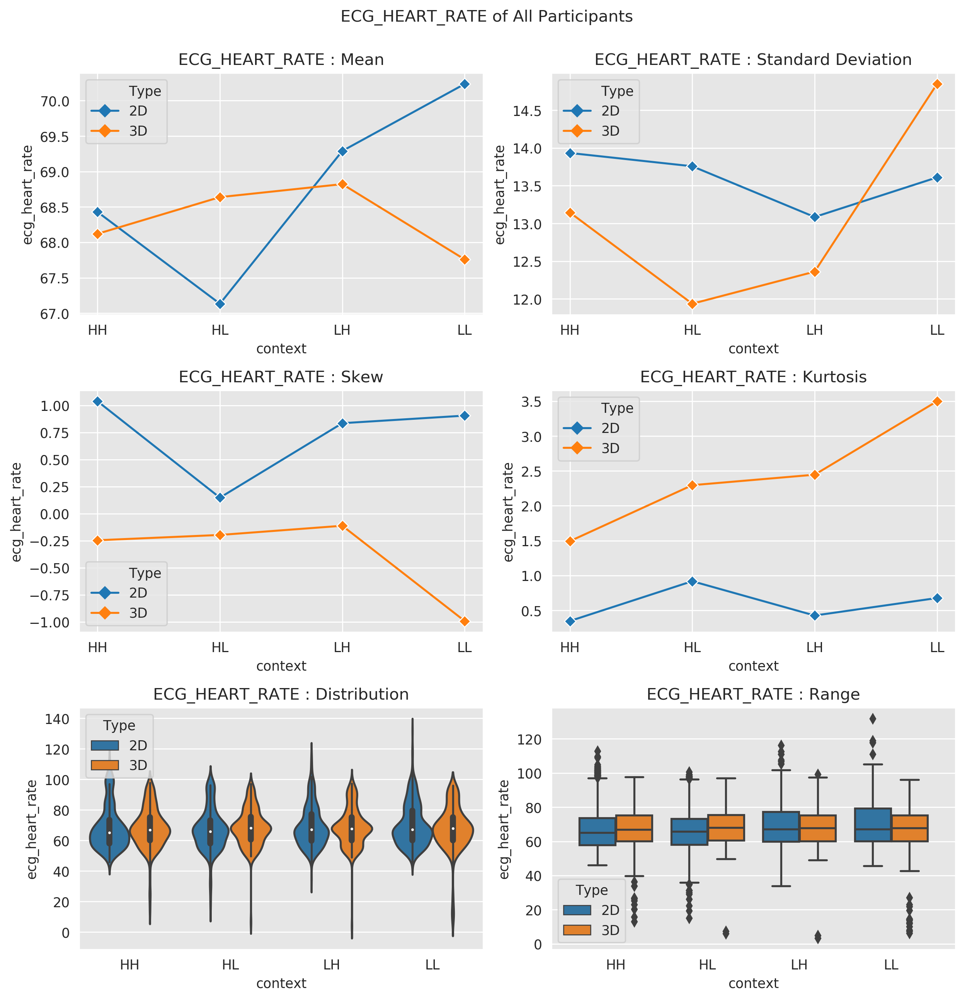

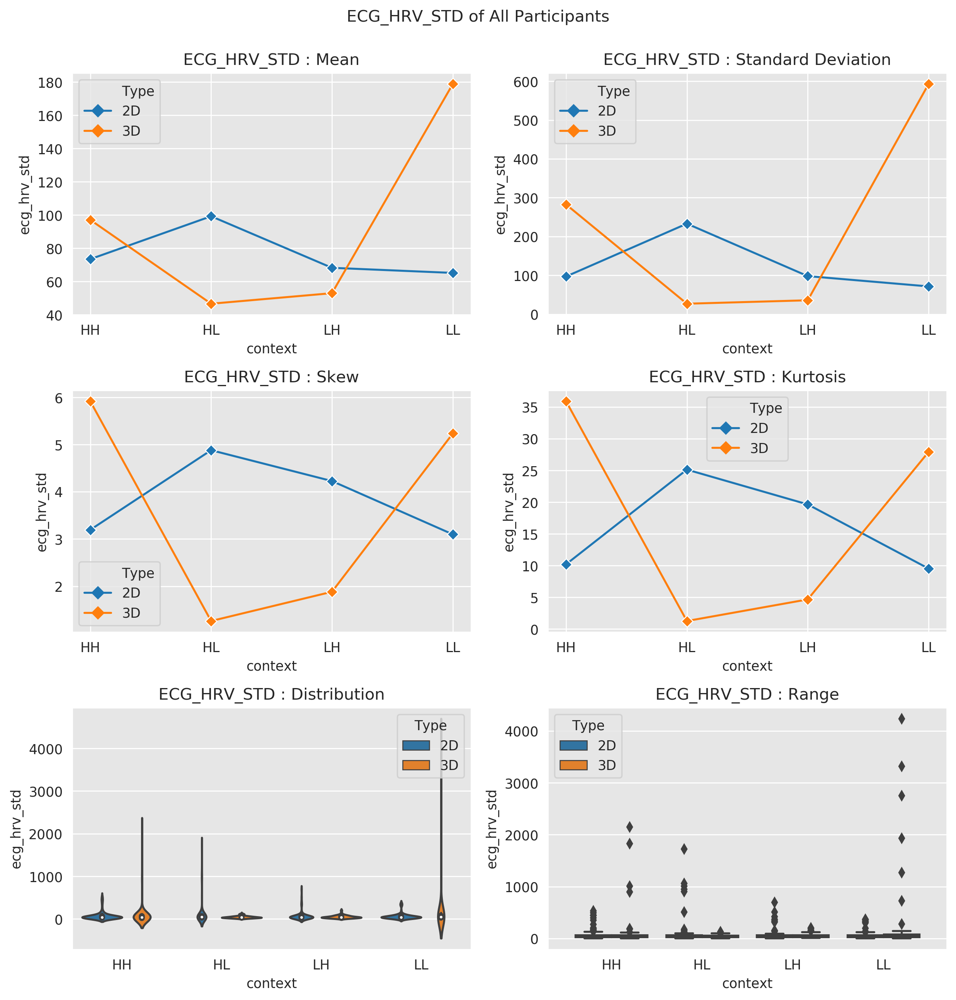

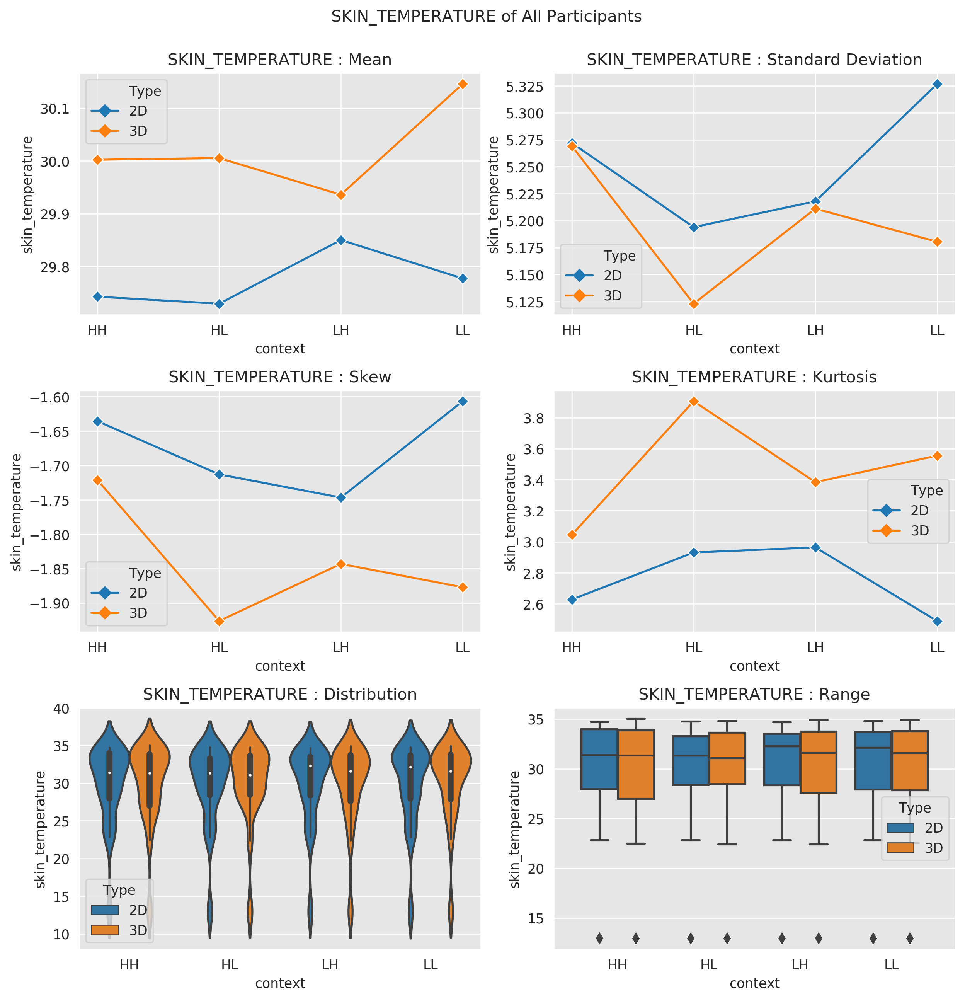

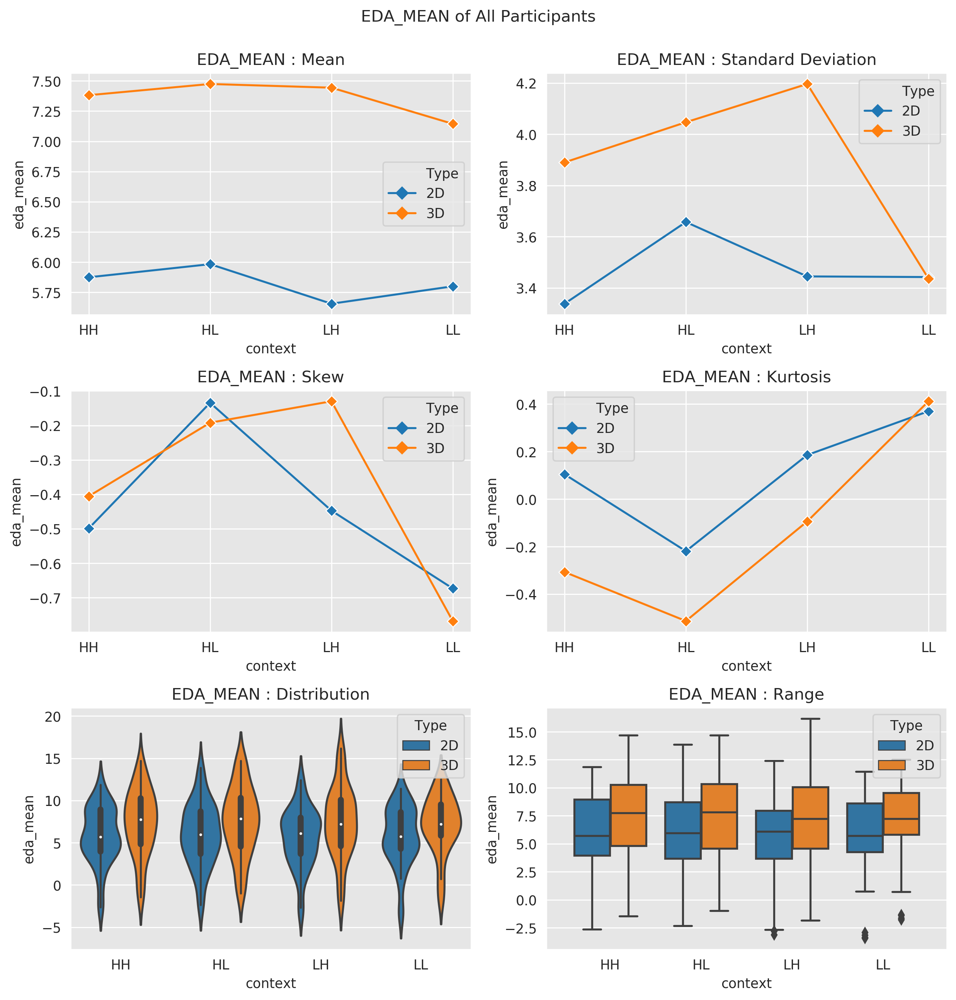

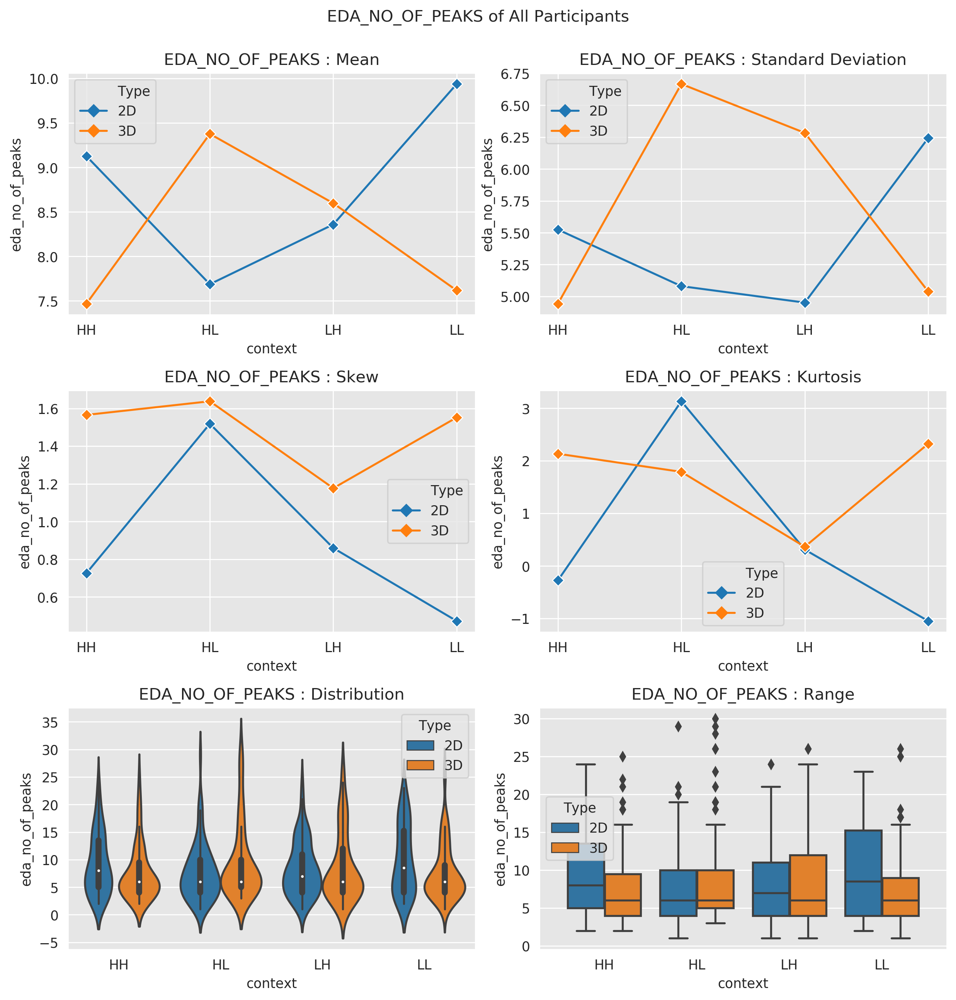

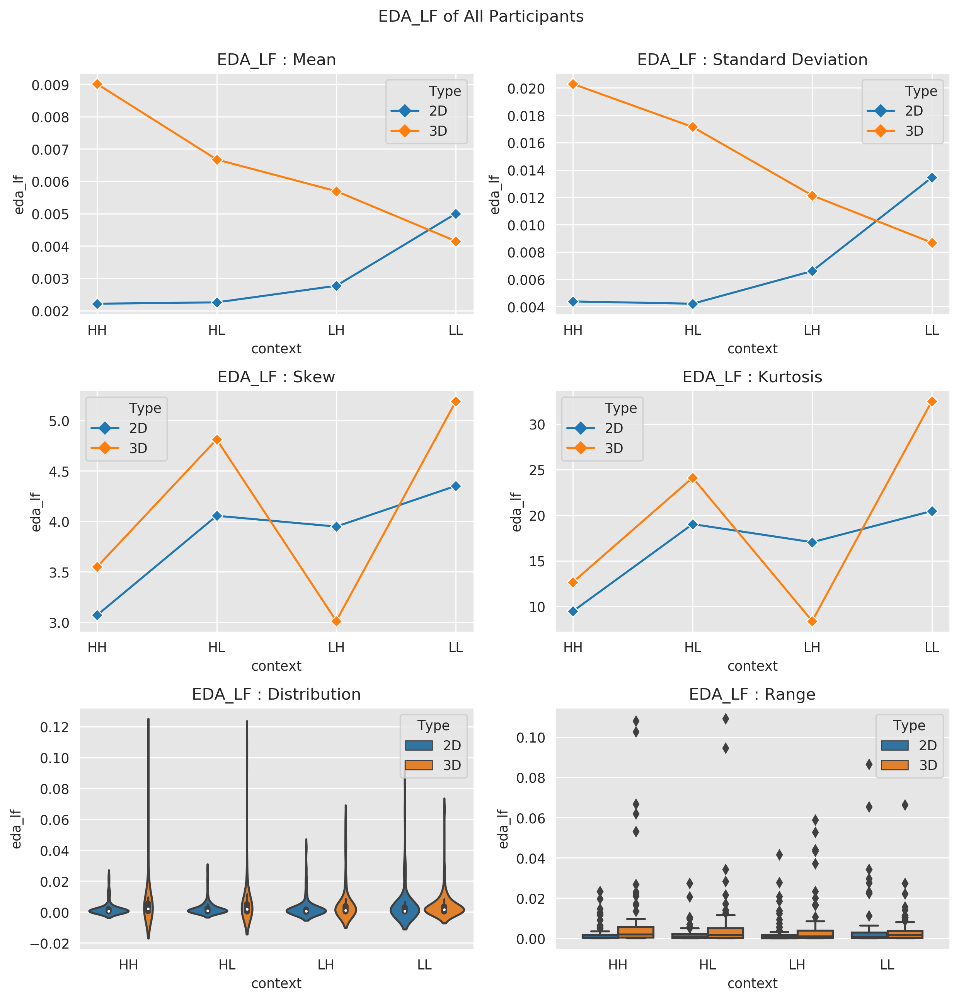

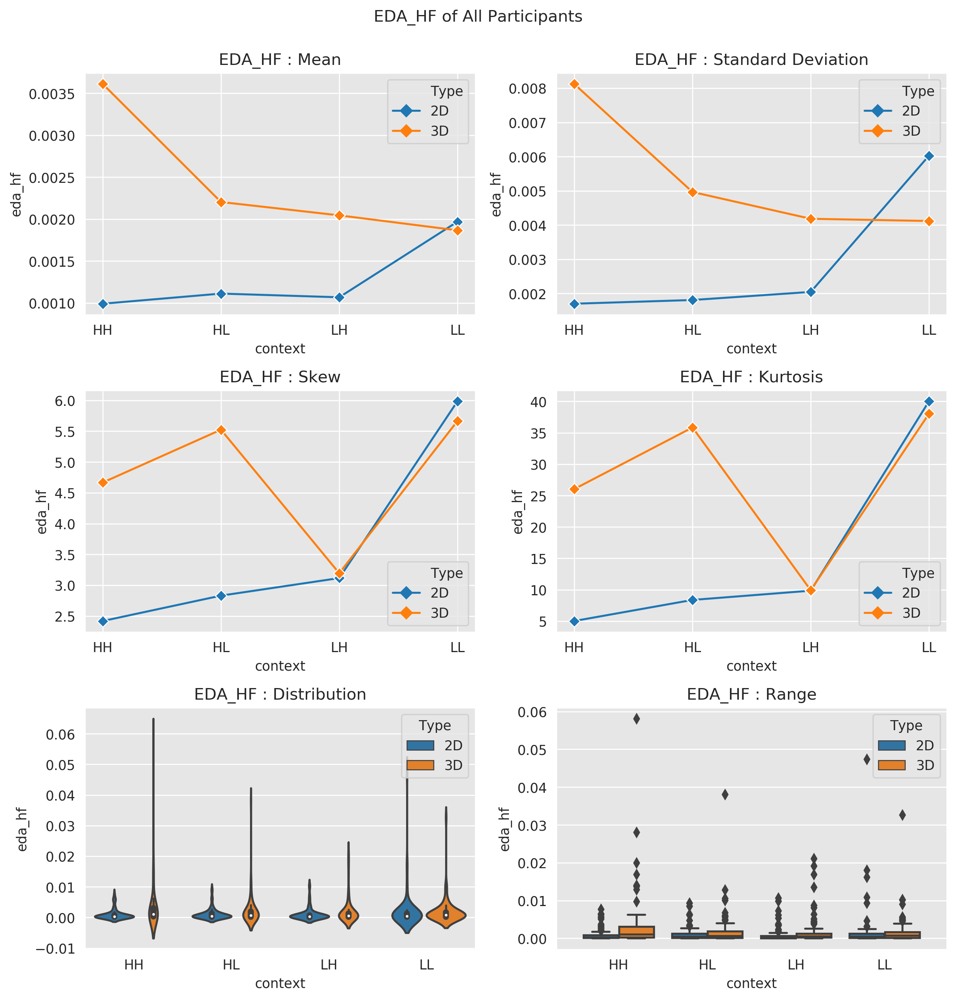

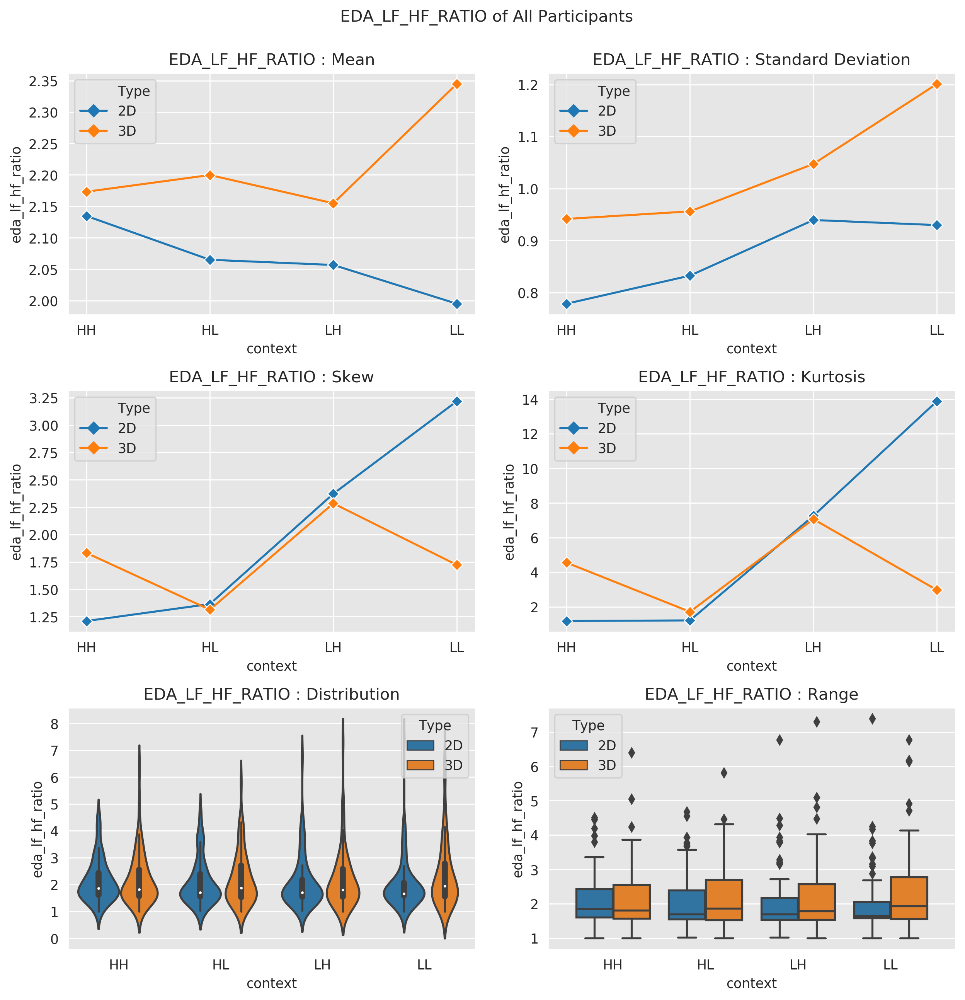

In [17]:
sb.set_style("darkgrid",{"axes.facecolor":".9"})
for feature_name in feature_names: #sample plot only
    fig, axes = plt.subplots(3,2, figsize =(10,10),dpi = 250)
    ax = axes.flatten()
    
    data = features_with_order[[feature_name,"event_order"]]
    data.dropna(inplace = True)
    two_d = data.loc(axis = 0)[:,'2D',:,:]
    two_d = two_d.reset_index().set_index(["Participant","Type","context","event_order","Datetime"] )
    three_d = data.loc(axis = 0)[:,'3D',:,:]
    three_d['event_order'] = three_d['event_order']+4
    three_d = three_d.reset_index().set_index(["Participant","Type","context","event_order","Datetime"] )
    
    sb.lineplot(x = "context", y = feature_name, hue = "Type",markers = ["D"]*4, style = "Type", dashes = False, data = data.groupby(["Type","context"]).mean().reset_index(), ax = ax[0])
    ax[0].set_title("{} : Mean".format(feature_name.upper()))
    
    
    sb.lineplot(x = "context", y = feature_name, hue = "Type",markers = ["D"]*4, style = "Type", dashes = False, data = data.groupby(["Type","context"]).std().reset_index(), ax = ax[1])
    ax[1].set_title("{} : Standard Deviation".format(feature_name.upper()))
    
    d = pd.DataFrame(data.groupby(["Type","context"]).apply(lambda x: skew(x.values)[0]), columns = [feature_name])
    sb.lineplot(x = "context", y = feature_name, hue = "Type", markers = ["D"]*4, style = "Type", dashes = False, data = d.reset_index(),  ax = ax[2])
    ax[2].set_title("{} : Skew".format(feature_name.upper()))
    
    d = pd.DataFrame(data.groupby(["Type","context"]).apply(lambda x: kurtosis(x.values)[0]), columns = [feature_name])
    sb.lineplot(x = "context", y = feature_name, hue = "Type",markers = ["D"]*4, style = "Type", dashes = False, data = d.reset_index(),  ax = ax[3])
    ax[3].set_title("{} : Kurtosis".format(feature_name.upper()))
    
    sb.violinplot(x = "context", y = feature_name,hue = "Type",hue_order = ["2D","3D"], order = ["HH", "HL", "LH", "LL"],
                data = data.reset_index().sort_index(sort_remaining = True), ax = ax[4])
    ax[4].set_title("{} : Distribution".format(feature_name.upper()))
    
    sb.boxplot(x = "context", y = feature_name,hue = "Type", hue_order = ["2D","3D"], order = ["HH", "HL", "LH", "LL"],
                data = data.reset_index().sort_index(sort_remaining = True), ax = ax[5])
    ax[5].set_title("{} : Range".format(feature_name.upper()))
    plt.subplots_adjust(hspace = 0.5)
    
    suptitle = plt.suptitle("{} of All Participants".format(feature_name.upper()), y = 1.03)
    plt.tight_layout()
    
#     fig.savefig("/mnt/bkt_prd_dsv_brain_therapy_raw/MVP_FA_Visualizations/feature_summary_all_participants/{}.png".format(feature_name), 
#                dpi = fig.dpi, bbox_inches = 'tight', bbox_extra_artists = [suptitle])
    plt.plot()
    plt.show()
#     break


### THIS IS JUST ANOTHER WAY OF SHOWING THE PLOTS

In [18]:
# sb.set_style("darkgrid",{"axes.facecolor":".9"})
# for feature_name in feature_names:
#     fig, axes = plt.subplots(6,1, figsize =(10,15),dpi = 200)
#     ax = axes.flatten()
    
#     data = features[[feature_name,"event_order"]]
#     two_d = data.loc(axis = 0)[:,'2D',:,:]
#     three_d = data.loc(axis = 0)[:,'3D',:,:]
    

    
#     #--------------PLOTTING---------------------
#     #___________MEAN_____________
#     d2 = two_d.groupby(["Type","context"]).mean().reset_index()
#     d2['event_order'] = np.arange(0,len(d2['context']))

#     d3 = three_d.groupby(["Type","context"]).mean().reset_index()
#     d3['event_order'] = np.arange(4,len(d3['context'])+4)
  
#     sb.lineplot(x = "event_order", y = feature_name, label = "2D",markers = ["D"]*4, style = "Type", dashes = False, data = d2, ax = ax[0], legend = False)
#     sb.lineplot(x = "event_order", y = feature_name, label = "3D",markers = ["D"]*4, style = "Type", color = 'coral', dashes = False, data = d3 ,ax = ax[0], legend = False)
#     ax[0].set_title("{} : Mean".format(feature_name.upper()))
#     ax[0].set_xticklabels(np.concatenate([d2.reset_index()["context"].unique(),d3.reset_index()['context'].unique()]))
#     ax[0].legend()
    
#     #__________STD_____________
    
#     d2 = two_d.groupby(["Type","context"]).std().reset_index()
#     d2['event_order'] = np.arange(0,len(d2['context']))

#     d3 = three_d.groupby(["Type","context"]).std().reset_index()
#     d3['event_order'] = np.arange(4,len(d3['context'])+4)
    
#     sb.lineplot(x = "event_order", y = feature_name, label = "2D",markers = ["D"]*4, style = "Type", dashes = False, data = d2, ax = ax[1], legend = False)
#     sb.lineplot(x = "event_order", y = feature_name, label = "3D",markers = ["D"]*4, style = "Type", color = 'coral', dashes = False, data = d3 ,ax = ax[1], legend = False)
#     ax[1].set_title("{} : Standard Deviation".format(feature_name.upper()))
#     ax[1].set_xticklabels(np.concatenate([d2.reset_index()["context"].unique(),d3.reset_index()['context'].unique()]))
#     ax[1].legend()
    
#     #______________SKEW___________
    
#     d2 = pd.DataFrame(two_d.groupby(["Type","context"]).apply(lambda x: skew(x.values)[0]), columns = [feature_name]).reset_index()
#     d2['event_order'] = np.arange(0,len(d2['context']))

#     d3 = pd.DataFrame(three_d.groupby(["Type","context"]).apply(lambda x: skew(x.values)[0]), columns = [feature_name]).reset_index()
#     d3['event_order'] = np.arange(4,len(d3['context'])+4)
    
#     sb.lineplot(x = "event_order", y = feature_name, label = "2D",markers = ["D"]*4, style = "Type", dashes = False, data = d2, ax = ax[2], legend = False)
#     sb.lineplot(x = "event_order", y = feature_name, label = "3D",markers = ["D"]*4, style = "Type", color = 'coral', dashes = False, data = d3 ,ax = ax[2], legend = False)
#     ax[2].set_title("{} : Skew".format(feature_name.upper()))
#     ax[2].set_xticklabels(np.concatenate([d2.reset_index()["context"].unique(),d3.reset_index()['context'].unique()]))
#     ax[2].legend()
    
#     #______________KURTOSIS_____________
    
    
#     d2 = pd.DataFrame(two_d.groupby(["Type","context"]).apply(lambda x: kurtosis(x.values)[0]), columns = [feature_name]).reset_index()
#     d2['event_order'] = np.arange(0,len(d2['context']))

#     d3 = pd.DataFrame(three_d.groupby(["Type","context"]).apply(lambda x: kurtosis(x.values)[0]), columns = [feature_name]).reset_index()
#     d3['event_order'] = np.arange(4,len(d3['context'])+4)
    
#     sb.lineplot(x = "event_order", y = feature_name, label = "2D",markers = ["D"]*4, style = "Type", dashes = False, data = d2, ax = ax[3], legend = False)
#     sb.lineplot(x = "event_order", y = feature_name, label = "3D",markers = ["D"]*4, style = "Type", color = 'coral', dashes = False, data = d3 ,ax = ax[3], legend = False)
#     ax[3].set_title("{} : Kurtosis".format(feature_name.upper()))
#     ax[2].set_xticklabels(np.concatenate([d2.reset_index()["context"].unique(),d3.reset_index()['context'].unique()]))
#     ax[2].legend()
    
    
#     #_____________DISTRIBUTION____________
#     sb.violinplot(x = "context", y = feature_name,hue = "Type",hue_order = ["2D","3D"], order = ["HH", "HL", "LH", "LL"],
#                 data = data.reset_index().sort_index(sort_remaining = True), ax = ax[4])
#     ax[4].set_title("{} : Distribution".format(feature_name.upper()))
    
    
# #_______________RANGE_____________________
#     sb.boxplot(x = "context", y = feature_name,hue = "Type", hue_order = ["2D","3D"], order = ["HH", "HL", "LH", "LL"],
#                 data = data.reset_index().sort_index(sort_remaining = True), ax = ax[5])
#     ax[5].set_title("{} : Range".format(feature_name.upper()))
#     plt.subplots_adjust(hspace = 0.5)
#     plt.tight_layout()
